In [42]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns


In [43]:
df=pd.read_csv("/kaggle/input/bank-marketing/bank-additional-full.csv",sep = ';')

In [44]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [45]:
df.shape

(41188, 21)

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [47]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [48]:
df.value_counts()

age  job          marital  education            default  housing  loan  contact    month  day_of_week  duration  campaign  pdays  previous  poutcome     emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed  y  
36   retired      married  unknown              no       no       no    telephone  jul    thu          88        1         999    0         nonexistent   1.4          93.918          -42.7          4.966      5228.1       no     2
39   blue-collar  married  basic.6y             no       no       no    telephone  may    thu          124       1         999    0         nonexistent   1.1          93.994          -36.4          4.855      5191.0       no     2
27   technician   single   professional.course  no       no       no    cellular   jul    mon          331       2         999    0         nonexistent   1.4          93.918          -42.7          4.962      5228.1       no     2
55   services     married  high.school          unknown  no       no    cellular 

In [49]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

<Axes: >

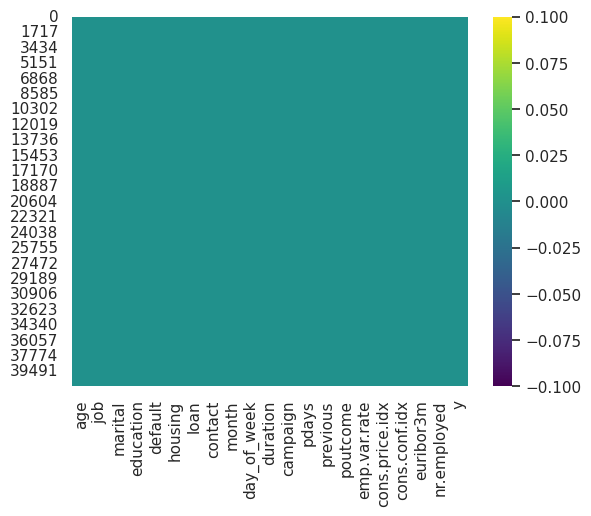

In [50]:
sns.heatmap(df.isnull(),cmap="viridis")

In [51]:
df.duplicated().value_counts()

False    41176
True        12
Name: count, dtype: int64

In [52]:
df.drop_duplicates(inplace = True)
df.duplicated().value_counts()

False    41176
Name: count, dtype: int64

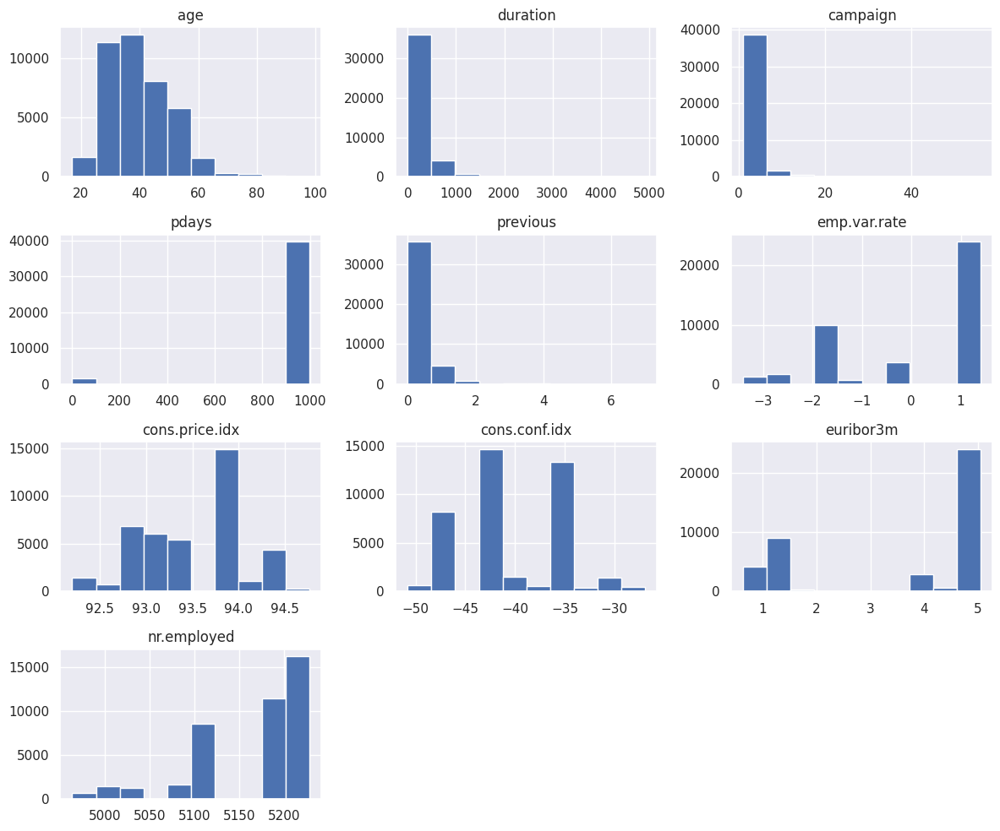

In [53]:
df.hist(figsize=(12, 10))  # Adjust the width and height as needed
plt.tight_layout()  # Optional: To make sure plots don't overlap
plt.show()

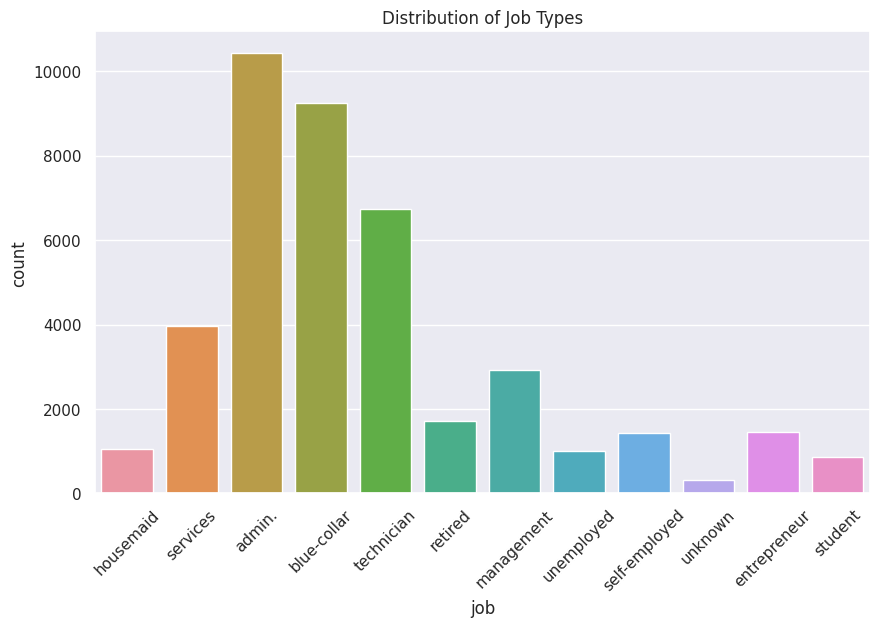

In [54]:
# Bar plot for the 'job' column
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='job')
plt.title('Distribution of Job Types')
plt.xticks(rotation=45)
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


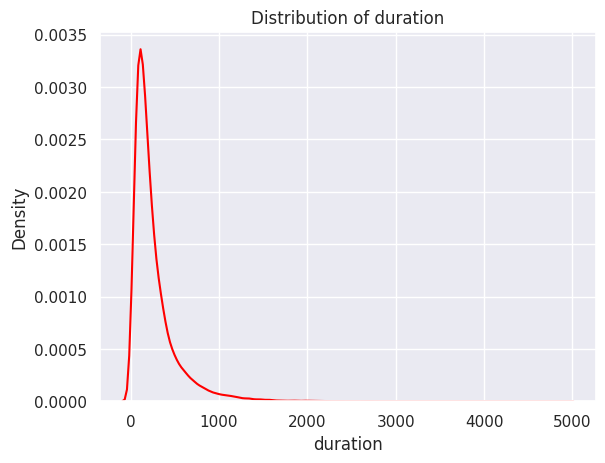

In [55]:
sns.kdeplot(data=df['duration'], color='red')

plt.title('Distribution of duration')
plt.show()

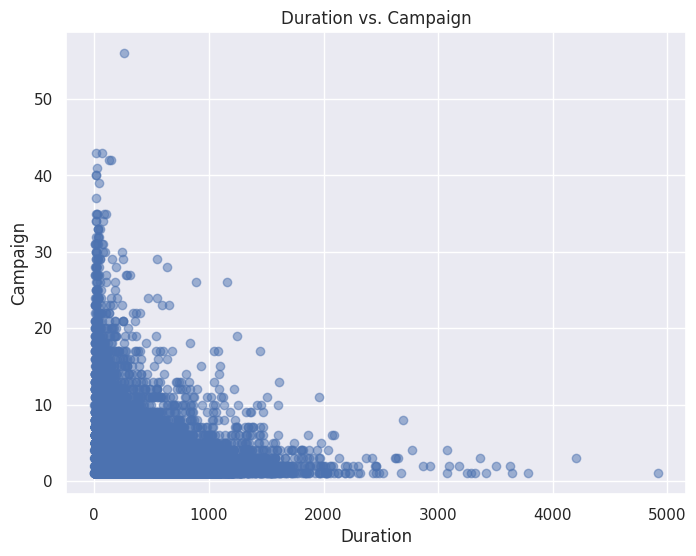

In [56]:
# Scatter plot between 'duration' and 'campaign'
plt.figure(figsize=(8, 6))
plt.scatter(df['duration'], df['campaign'], alpha=0.5)
plt.title('Duration vs. Campaign')
plt.xlabel('Duration')
plt.ylabel('Campaign')
plt.show()


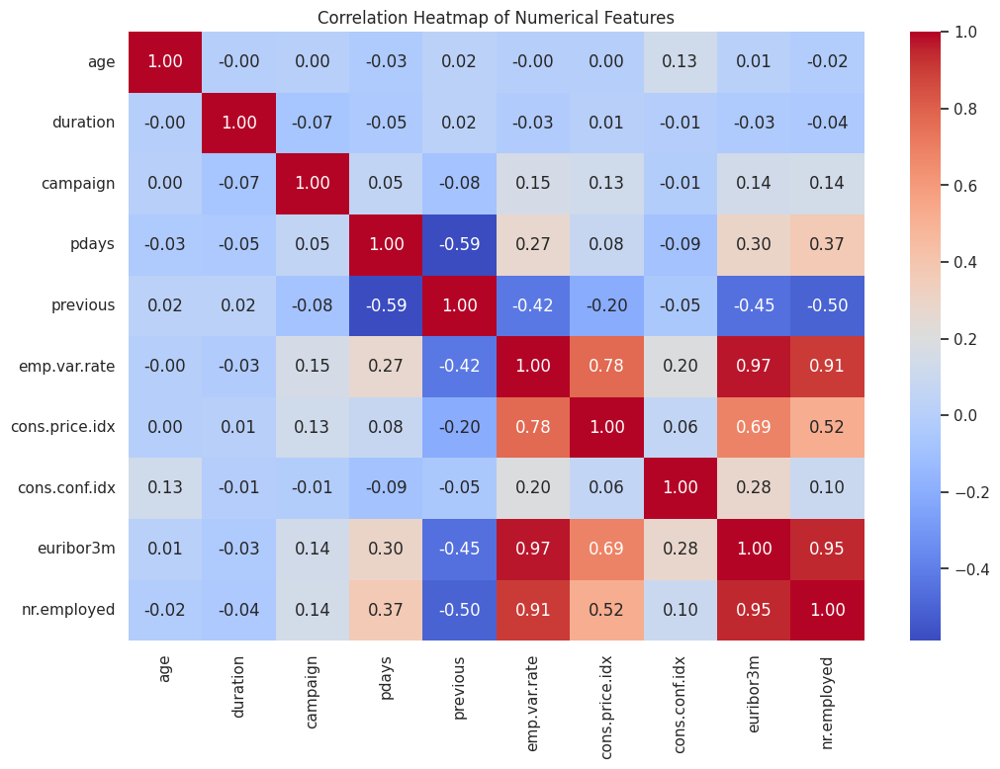

In [57]:
# Select only numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64'])

# Now you can perform numerical operations like correlation
correlation_matrix = numerical_columns.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()


In [58]:
# Encode categorical columns (e.g., 'job', 'marital', etc.)
df_encoded = pd.get_dummies(df, columns=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome'])
df_encoded

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,False,False,False,True,False,False,False,False,True,False
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,False,False,False,True,False,False,False,False,True,False
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,False,False,False,True,False,False,False,False,True,False
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,False,False,False,True,False,False,False,False,True,False
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,False,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,False,False,True,False,False,False,False,False,True,False
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,False,False,True,False,False,False,False,False,True,False
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,False,False,True,False,False,False,False,False,True,False
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,False,False,True,False,False,False,False,False,True,False


In [59]:
from sklearn.preprocessing import LabelEncoder

# Apply LabelEncoder to categorical columns
label_encoder = LabelEncoder()

for col in ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome']:
    df[col] = label_encoder.fit_transform(df[col])

# Now the DataFrame has numerical values for categorical columns


In [60]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,3,1,0,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,no
1,57,7,1,3,1,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,no
2,37,7,1,3,0,2,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,no
3,40,0,1,1,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,no
4,56,7,1,3,0,0,2,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,5,1,5,0,2,0,0,7,0,...,1,999,0,1,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,1,1,5,0,0,0,0,7,0,...,1,999,0,1,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,5,1,6,0,2,0,0,7,0,...,2,999,0,1,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,9,1,5,0,0,0,0,7,0,...,1,999,0,1,-1.1,94.767,-50.8,1.028,4963.6,yes


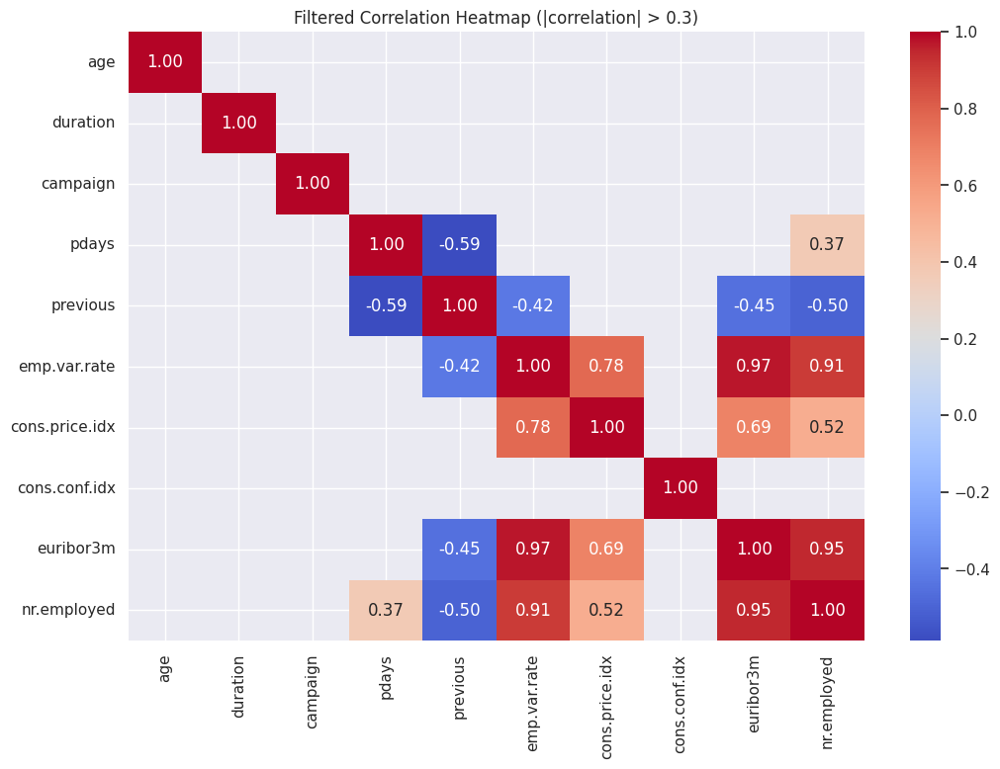

In [61]:
# Only show correlations greater than a certain threshold (e.g., 0.3)
threshold = 0.3
high_corr = correlation_matrix[(correlation_matrix >= threshold) | (correlation_matrix <= -threshold)]

plt.figure(figsize=(12, 8))
sns.heatmap(high_corr, annot=True, cmap='coolwarm', fmt='.2f', mask=high_corr.isnull())
plt.title('Filtered Correlation Heatmap (|correlation| > 0.3)')
plt.show()


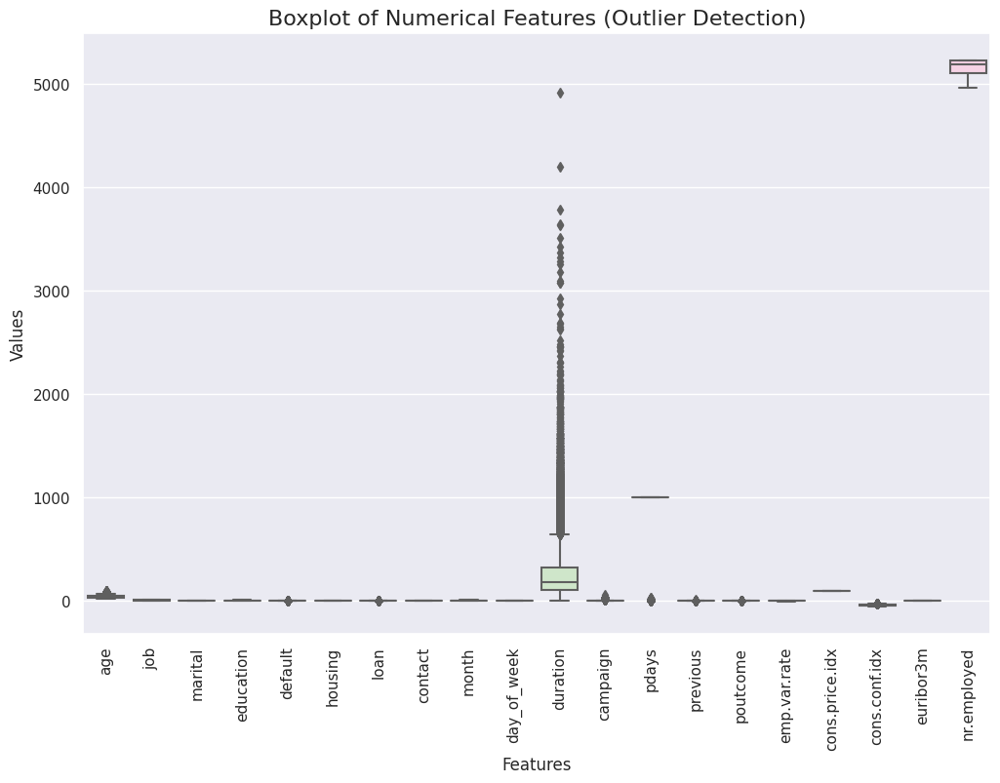

In [62]:
# Set up the figure size for better visibility
plt.figure(figsize=(12, 8))

# Create a boxplot for all numerical columns in the DataFrame
sns.boxplot(data=df.select_dtypes(include=['float64', 'int64']), palette="Set3")

# Customize the plot
plt.xticks(rotation=90)  # Rotate x labels for better readability
plt.title('Boxplot of Numerical Features (Outlier Detection)', fontsize=16)
plt.ylabel('Values', fontsize=12)
plt.xlabel('Features', fontsize=12)

# Show the plot
plt.show()

In [63]:
# Calculate IQR for 'duration'
Q1 = df['duration'].quantile(0.25)
Q3 = df['duration'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
# Cap the outliers
df['duration'] = np.where(df['duration'] > upper_bound, upper_bound, df['duration'])
df['duration'] = np.where(df['duration'] < lower_bound, lower_bound, df['duration'])

# Display capped data
df['duration'].describe()


count    41176.000000
mean       235.021335
std        177.365635
min          0.000000
25%        102.000000
50%        180.000000
75%        319.000000
max        644.500000
Name: duration, dtype: float64

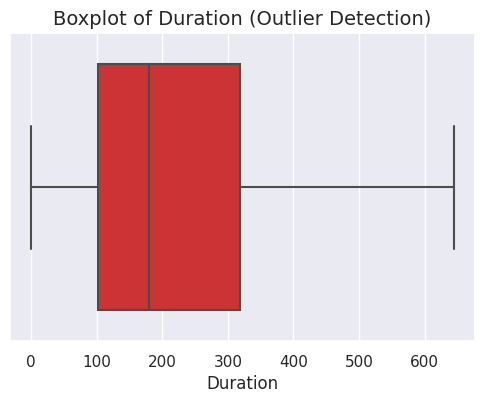

In [64]:
# Set up figure size
plt.figure(figsize=(6, 4))

# Create a boxplot for the 'duration' column
sns.boxplot(x=df['duration'], palette="Set1")

# Customize plot
plt.title('Boxplot of Duration (Outlier Detection)', fontsize=14)
plt.xlabel('Duration', fontsize=12)

# Show plot
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


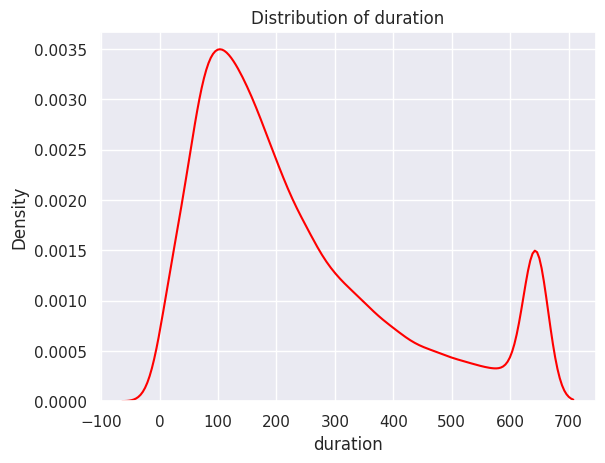

In [65]:
sns.kdeplot(data=df['duration'], color='red')

plt.title('Distribution of duration')
plt.show()

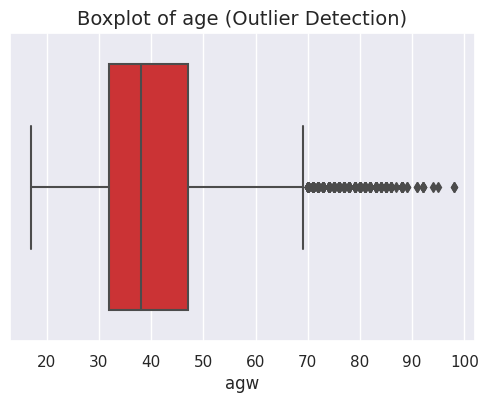

In [66]:
# Set up figure size
plt.figure(figsize=(6, 4))

# Create a boxplot for the 'duration' column
sns.boxplot(x=df['age'], palette="Set1")

# Customize plot
plt.title('Boxplot of age (Outlier Detection)', fontsize=14)
plt.xlabel('agw', fontsize=12)

# Show plot
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


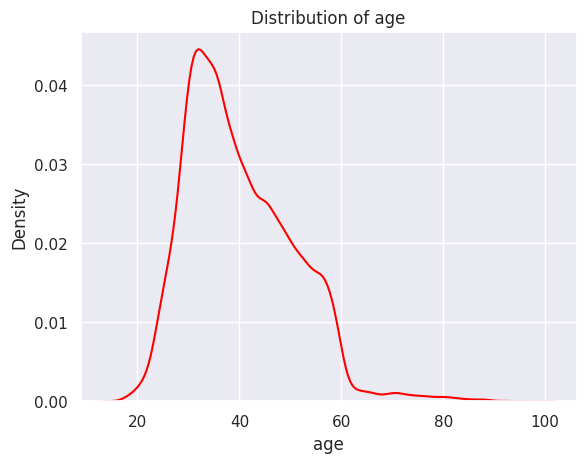

In [67]:
sns.kdeplot(data=df['age'], color='red')

plt.title('Distribution of age')
plt.show()

In [68]:
Q1 = df['age'].quantile(0.25)
Q3 = df['age'].quantile(0.75)
IQR = Q3 - Q1

upper_bound = Q3 + 1.5 * IQR

df = df[(df['age']>Q1 - 1.5 * IQR) & (df['age']<Q3 + 1.5 * IQR)] 

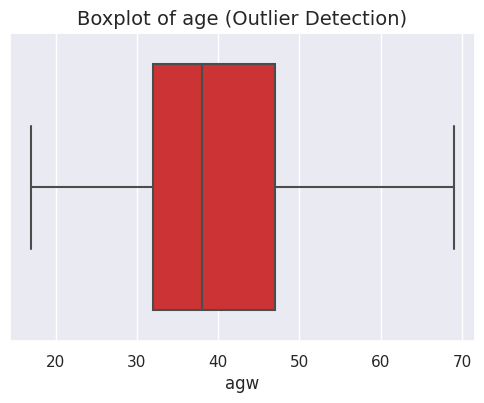

In [69]:
# Set up figure size
plt.figure(figsize=(6, 4))

# Create a boxplot for the 'duration' column
sns.boxplot(x=df['age'], palette="Set1")

# Customize plot
plt.title('Boxplot of age (Outlier Detection)', fontsize=14)
plt.xlabel('agw', fontsize=12)

# Show plot
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


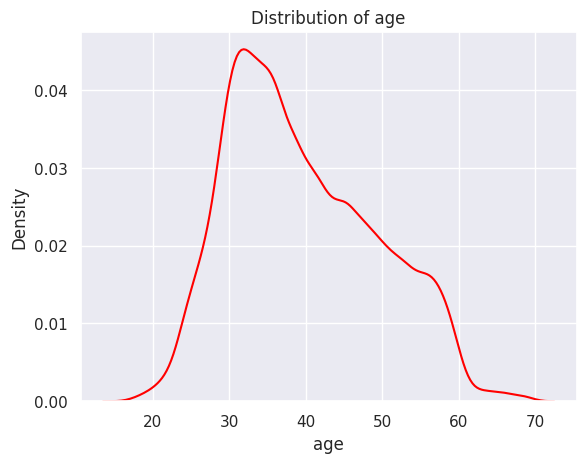

In [70]:
sns.kdeplot(data=df['age'], color='red')

plt.title('Distribution of age')
plt.show()

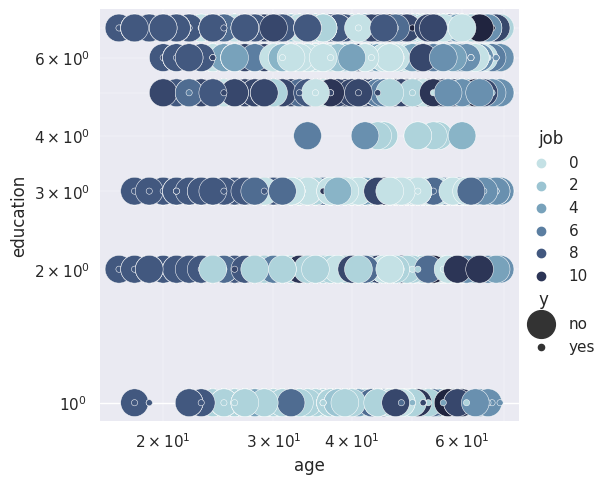

In [71]:
cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)
g = sns.relplot(
    data=df,
    x="age", y="education",
    hue="job",size="y",
    palette=cmap, sizes=(20,400),
)
g.set(xscale="log", yscale="log")
g.ax.xaxis.grid(True, "minor", linewidth=.25)
g.ax.yaxis.grid(True, "minor", linewidth=.25)
g.despine(left=True, bottom=True)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

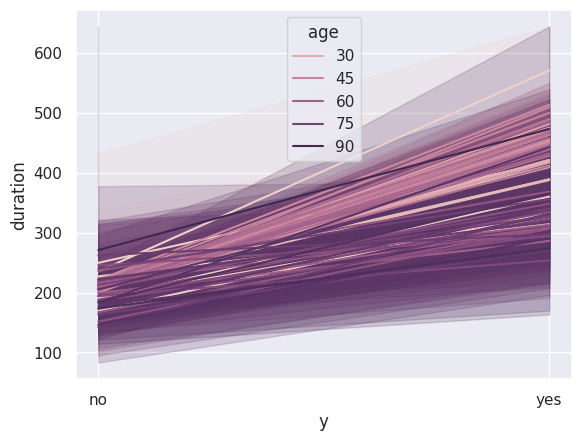

In [22]:
sns.set_theme(style="darkgrid")


# Plot the responses for different events and regions
sns.lineplot(x="y", y="duration",
             hue="age",
             data=df)

plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

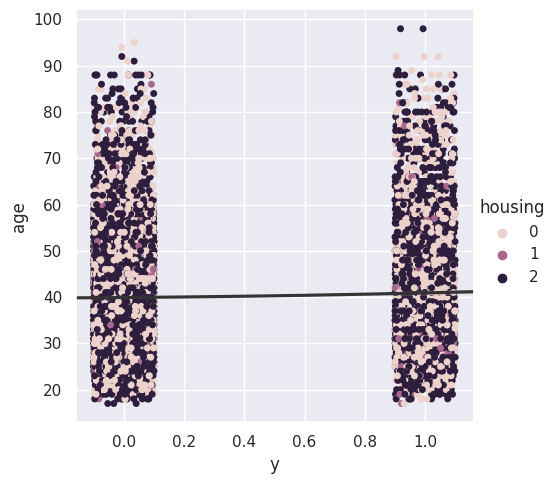

In [23]:
# Strip any extra spaces from column names
df.columns = df.columns.str.strip()

df["y"] = label_encoder.fit_transform(df["y"])


# Draw the categorical plot
sns.catplot(
    data=df, x="y", y="age", hue="housing",  # Ensure correct column names
    native_scale=True, zorder=1
)

# Draw the regression plot on top
sns.regplot(
    data=df, x="y", y="age",  # Ensure correct column names
    scatter=False, truncate=False, order=2, color=".2",
)

# Show the plot
plt.show()

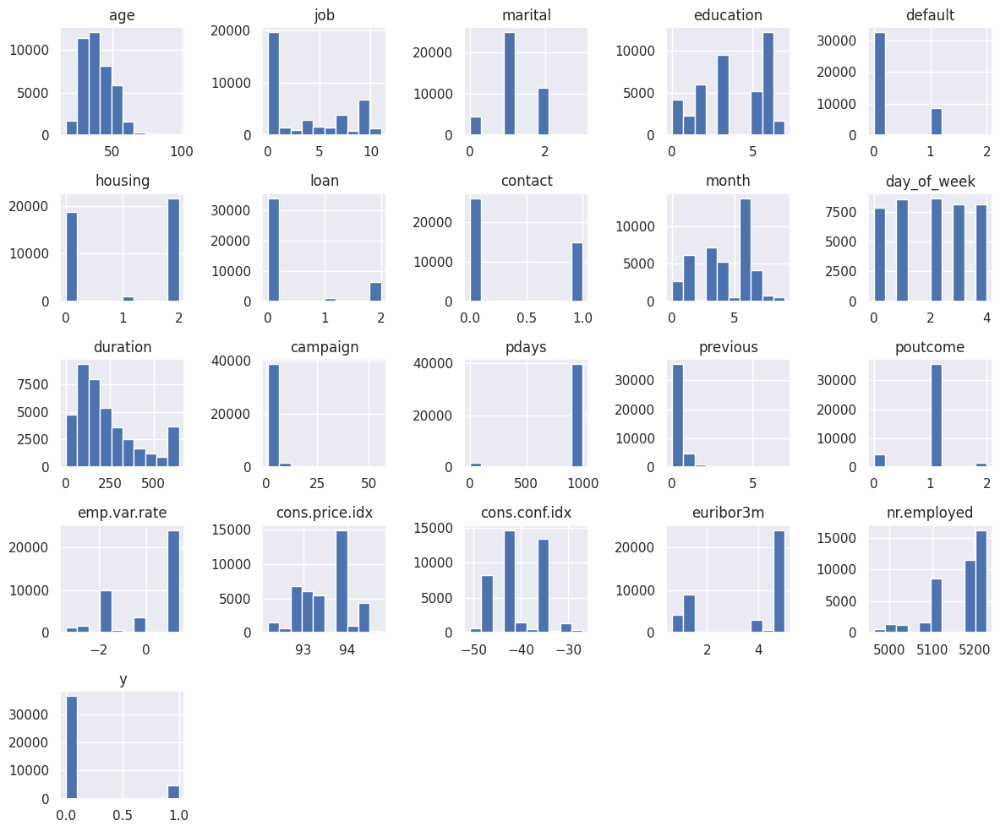

In [24]:
df.hist(figsize=(12, 10))  # Adjust the width and height as needed
plt.tight_layout()  # Optional: To make sure plots don't overlap
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

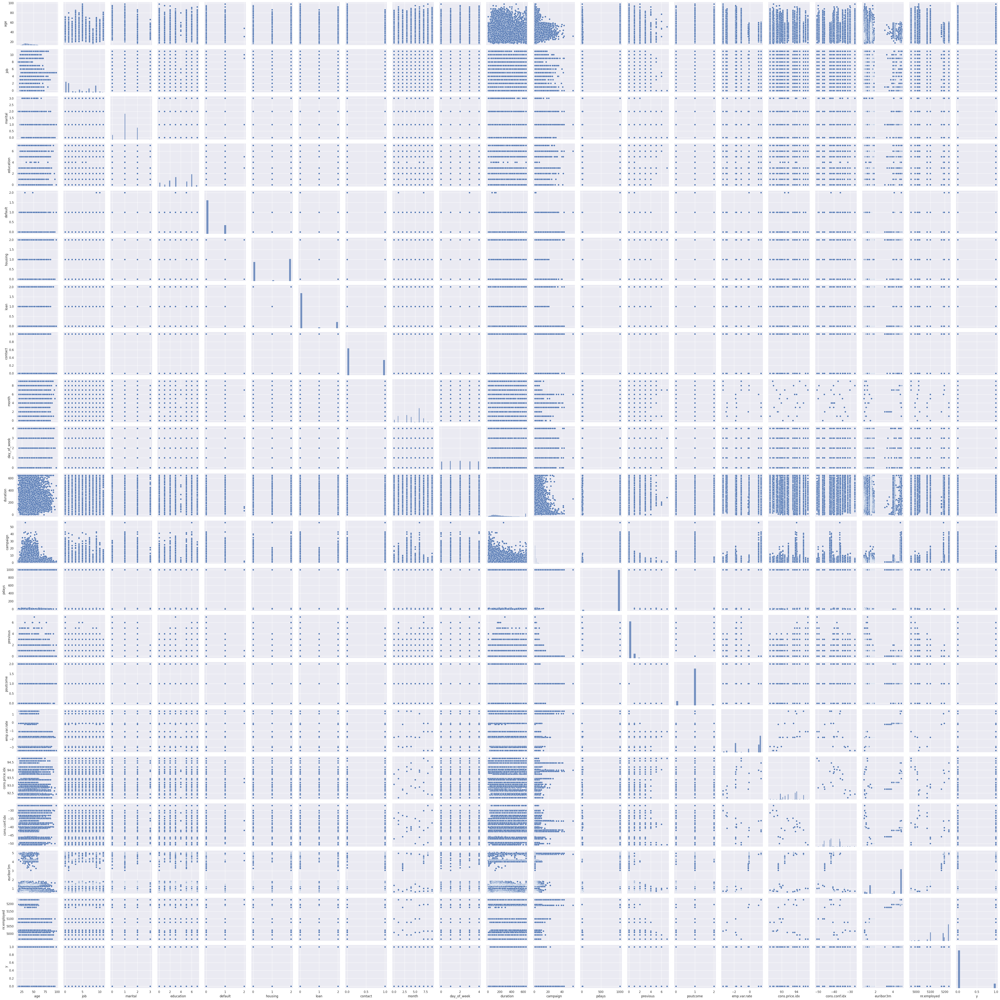

In [25]:
sns.pairplot(df) 
plt.tight_layout()  
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated a

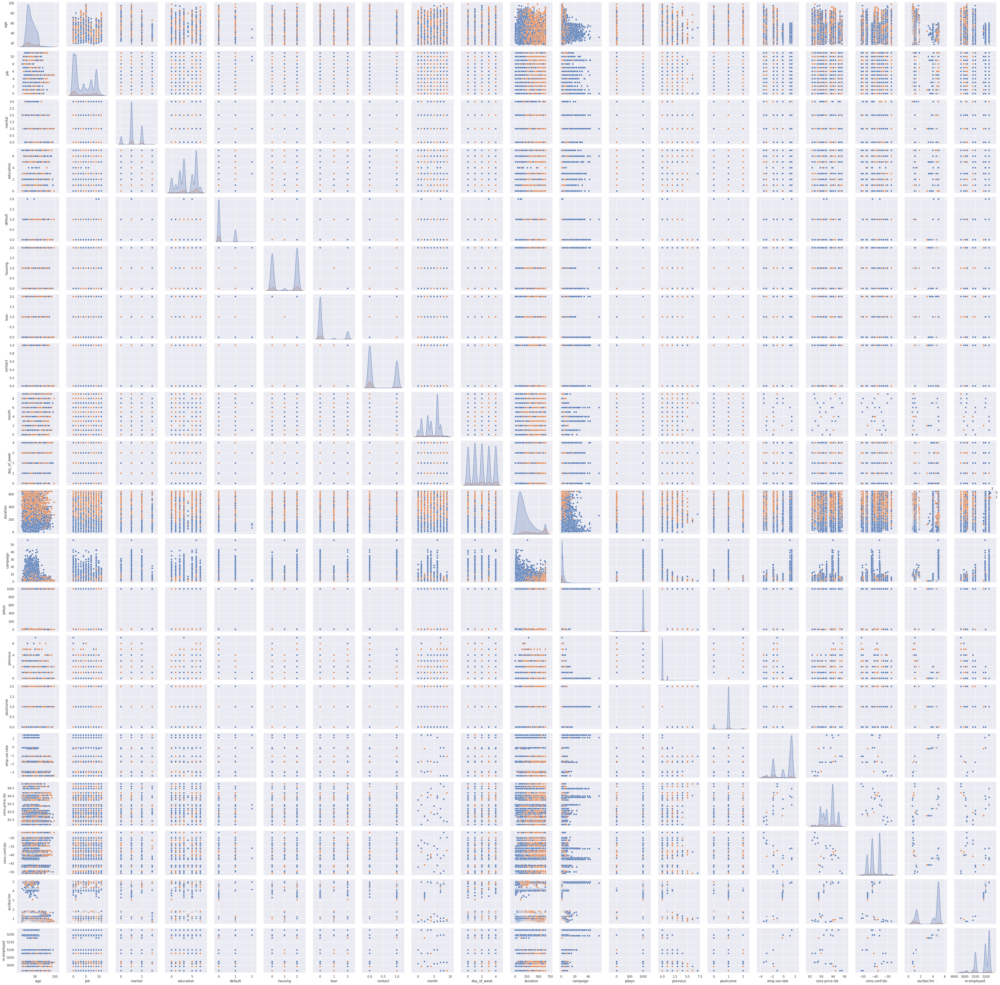

In [26]:
sns.pairplot(df,hue="y") 
plt.tight_layout()  
plt.show()

<Figure size 1000x700 with 0 Axes>

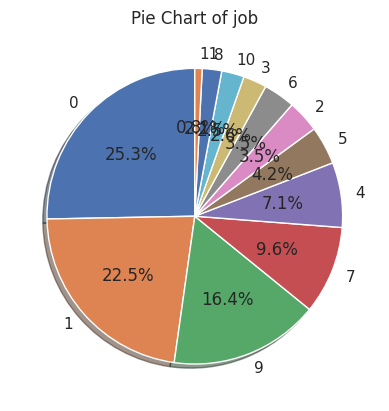

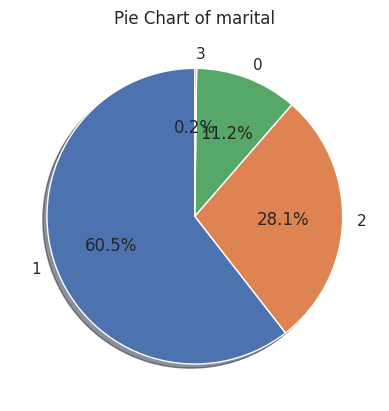

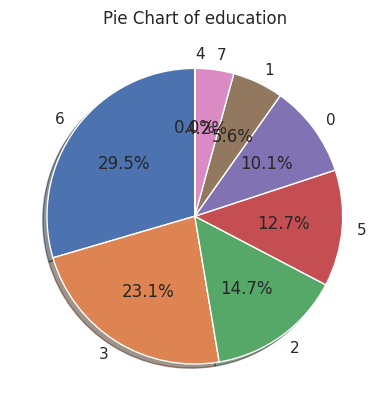

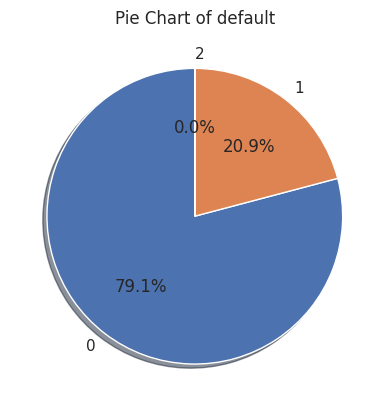

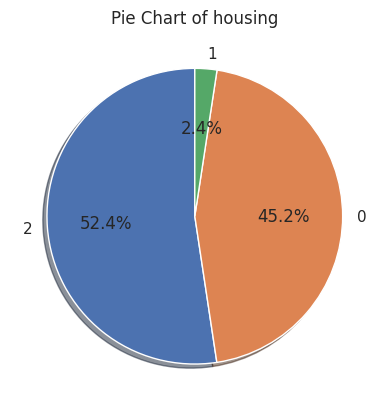

...

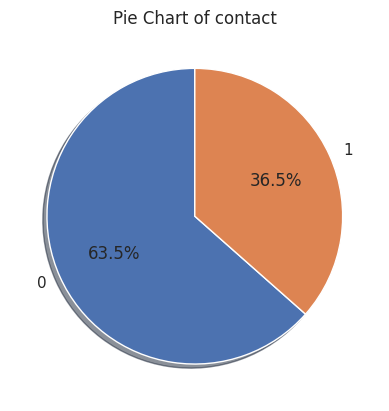

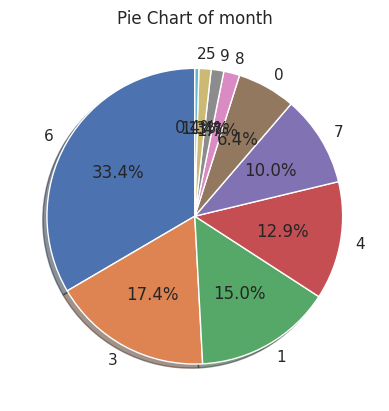

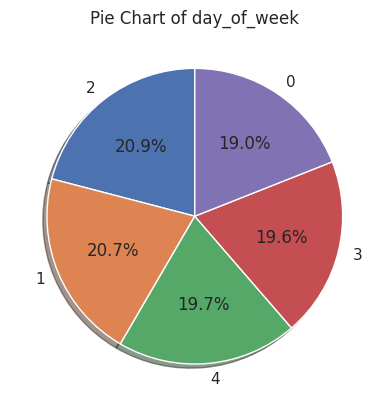

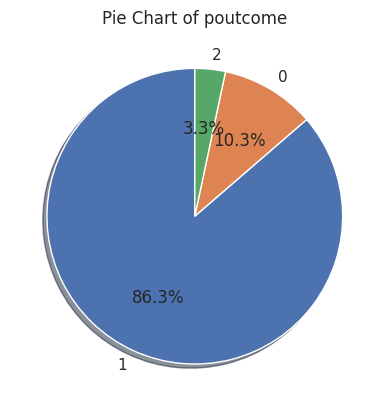

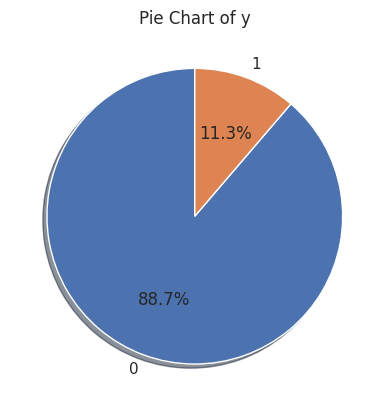

In [27]:
# Set the figure size for better visibility
plt.figure(figsize=(10, 7))

# List of columns to plot pie charts for (categorical columns)
categorical_columns = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']

# Iterate through the categorical columns
for col in categorical_columns:
    # Get the value counts for each column
    values = df[col].value_counts()
    
    # Create a pie chart
    plt.figure()
    values.plot.pie(autopct='%1.1f%%', startangle=90, shadow=True, legend=False)
    plt.title(f"Pie Chart of {col}")
    plt.ylabel('')  # Hide the y-label for better appearance
    plt.show()

In [72]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import pandas as pd

In [73]:
# Prepare the data
X = df.drop(columns=['y'])  # Features
y = df['y']  # Target

In [74]:
# Encoding categorical variables
X = pd.get_dummies(X, drop_first=True)  # One-hot encoding categorical columns
le = LabelEncoder()
y = le.fit_transform(y)  # Label encoding the target column

In [75]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [76]:
# Scale the numerical features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [77]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [78]:
# Define the neural network
model = Sequential()

# Input layer and first hidden layer
model.add(Dense(units=64, activation='relu', input_shape=(X_train.shape[1],)))

# Second hidden layer
model.add(Dense(units=32, activation='relu'))

# Output layer (binary classification, so use sigmoid)
model.add(Dense(units=1, activation='sigmoid'))


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [79]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model architecture
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,457 (13.50 KB)

 Trainable params: 3,457 (13.50 KB)

 Non-trainable params: 0 (0.00 B)

In [80]:
# Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8954 - loss: 0.2559 - val_accuracy: 0.9074 - val_loss: 0.1982
Epoch 2/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9128 - loss: 0.1860 - val_accuracy: 0.9090 - val_loss: 0.1936
Epoch 3/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9129 - loss: 0.1849 - val_accuracy: 0.9052 - val_loss: 0.1954
Epoch 4/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9137 - loss: 0.1825 - val_accuracy: 0.9089 - val_loss: 0.1928
Epoch 5/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9167 - loss: 0.1743 - val_accuracy: 0.9101 - val_loss: 0.1901
Epoch 6/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9152 - loss: 0.1736 - val_accuracy: 0.9073 - val_loss: 0.1910
Epoch 7/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9174 - loss: 0.1721 - val_accuracy: 0.9097 - val_loss: 0.1889
Epoch 8/20
1018/1018 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9171 - loss: 0.1742 - 

In [81]:
# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc}")
print(f"Test loss: {test_loss}")

255/255 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9107 - loss: 0.1821
Test Accuracy: 0.9094817042350769
Test loss: 0.19019684195518494


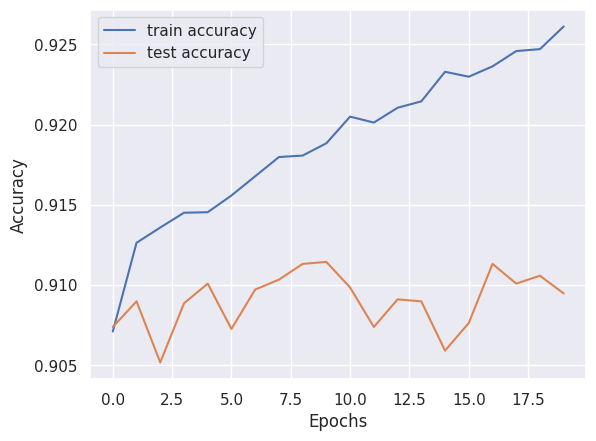

In [82]:
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='test accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [83]:
#Hyperparameter Tuning for Neural Network

In [106]:
# Define the function to create the model
def create_model(units=64, activation='relu'):
    model = Sequential()
    model.add(Dense(units=units, activation=activation, input_shape=(X_train.shape[1],)))  # Input layer
    model.add(Dense(units // 2, activation=activation))  # First hidden layer
    model.add(Dense(units // 4, activation=activation))  # Second hidden layer
    model.add(Dense(units // 8, activation=activation))  # Third hidden layer
    model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification
    
    # Compile model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [107]:
# List to store results
results = []

# Hyperparameter ranges
units_options = [32, 64, 128]
batch_sizes = [16, 32]
epochs_options = [10, 20]
activation_options = ['relu', 'tanh']

best_acc = 0
best_params = {}

for units in units_options:
    for batch_size in batch_sizes:
        for epochs in epochs_options:
            for activation in activation_options:
                print(f"Training with units={units}, batch_size={batch_size}, epochs={epochs}, activation={activation}")
                
                # Create and train the model
                model = create_model(units=units, activation=activation)
                history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0, validation_data=(X_test, y_test))
                
                # Evaluate the model
                loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
                
                # Store the results
                results.append({
                    'units': units,
                    'batch_size': batch_size,
                    'epochs': epochs,
                    'activation': activation,
                    'accuracy': accuracy
                })
                
                # Keep track of the best model
                if accuracy > best_acc:
                    best_acc = accuracy
                    best_params = {
                        'units': units,
                        'batch_size': batch_size,
                        'epochs': epochs,
                        'activation': activation
                    }
                print(f"Accuracy: {accuracy:.4f}")

# Create DataFrame from the results
results_df = pd.DataFrame(results)
print(f"Best accuracy: {best_acc:.4f}")
print(f"Best parameters: {best_params}")


Training with units=32, batch_size=16, epochs=10, activation=relu


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Accuracy: 0.9059
Training with units=32, batch_size=16, epochs=10, activation=tanh
Accuracy: 0.9114
Training with units=32, batch_size=16, epochs=20, activation=relu
Accuracy: 0.9032
Training with units=32, batch_size=16, epochs=20, activation=tanh
Accuracy: 0.9103
Training with units=32, batch_size=32, epochs=10, activation=relu
Accuracy: 0.9113
Training with units=32, batch_size=32, epochs=10, activation=tanh
Accuracy: 0.9090
Training with units=32, batch_size=32, epochs=20, activation=relu
Accuracy: 0.9069
Training with units=32, batch_size=32, epochs=20, activation=tanh
Accuracy: 0.9106
Training with units=64, batch_size=16, epochs=10, activation=relu
Accuracy: 0.9041
Training with units=64, batch_size=16, epochs=10, activation=tanh
Accuracy: 0.9090
Training with units=64, batch_size=16, epochs=20, activation=relu
Accuracy: 0.9157
Training with units=64, batch_size=16, epochs=20, activation=tanh
Accuracy: 0.9094
Training with units=64, batch_size=32, epochs=10, activation=relu
Accu

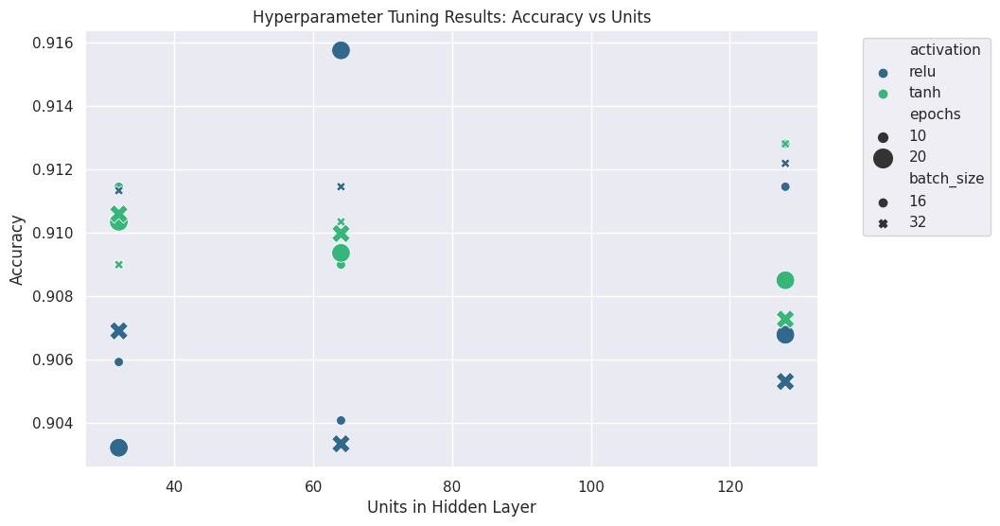

In [108]:
# Set theme for seaborn
sns.set_theme()

# Scatter plot of accuracy vs units
plt.figure(figsize=(10, 6))
sns.scatterplot(data=results_df, x='units', y='accuracy', hue='activation', style='batch_size', size='epochs', palette='viridis', sizes=(50, 200))
plt.title('Hyperparameter Tuning Results: Accuracy vs Units')
plt.xlabel('Units in Hidden Layer')
plt.ylabel('Accuracy')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


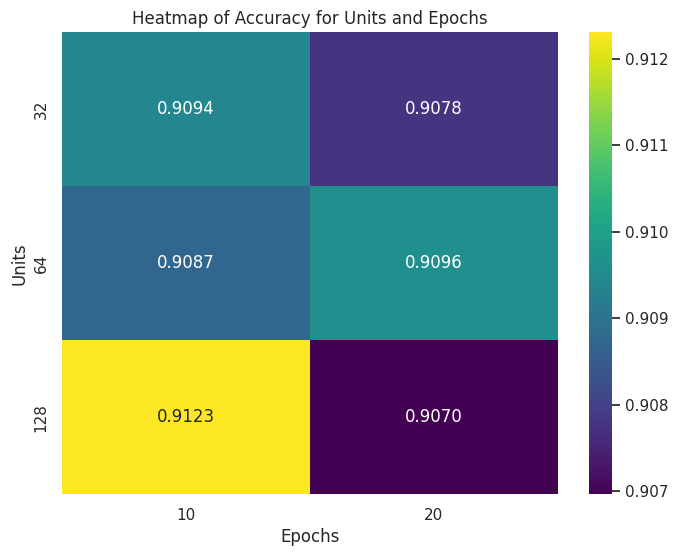

In [109]:
# Pivot the results to create a heatmap
pivot_table = results_df.pivot_table(values='accuracy', index='units', columns='epochs')

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(pivot_table, annot=True, cmap='viridis', fmt=".4f")
plt.title('Heatmap of Accuracy for Units and Epochs')
plt.xlabel('Epochs')
plt.ylabel('Units')
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


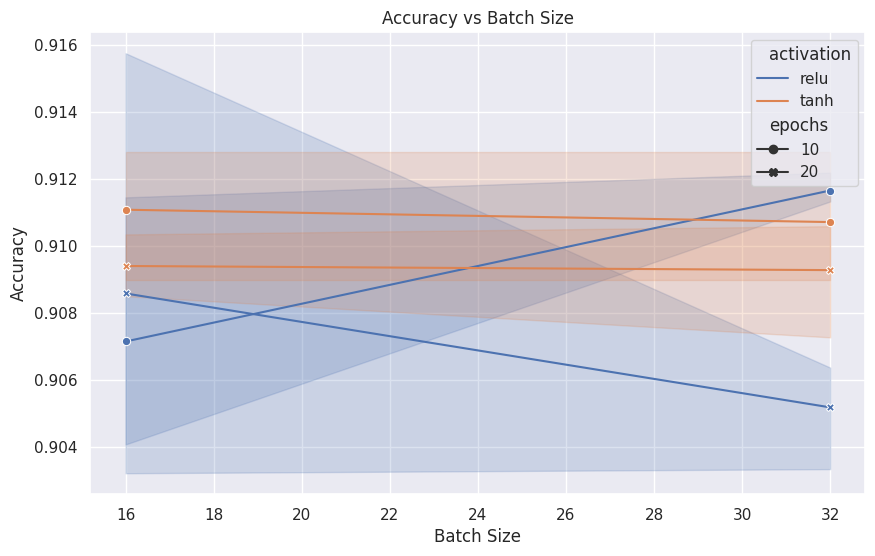

In [110]:
# Line plot for accuracy vs batch size
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_df, x='batch_size', y='accuracy', hue='activation', style='epochs', markers=True, dashes=False)
plt.title('Accuracy vs Batch Size')
plt.xlabel('Batch Size')
plt.ylabel('Accuracy')
plt.show()
